In [10]:
import numpy as np
import pandas as pd
import seaborn as sns
import nltk
import re

In [11]:
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences
from tensorflow.keras.models import Sequential


In [ ]:
fake = pd.read_csv("Fake.csv")
fake

,title,text,subject,date
0,Donald Trump Sends Out Embarrassing New Year’...,Donald Trump just couldn t wish all Americans ...,News,"December 31, 2017"
1,Drunk Bragging Trump Staffer Started Russian ...,House Intelligence Committee Chairman Devin Nu...,News,"December 31, 2017"
2,Sheriff David Clarke Becomes An Internet Joke...,"On Friday, it was revealed that former Milwauk...",News,"December 30, 2017"
3,Trump Is So Obsessed He Even Has Obama’s Name...,"On Christmas day, Donald Trump announced that ...",News,"December 29, 2017"
4,Pope Francis Just Called Out Donald Trump Dur...,Pope Francis used his annual Christmas Day mes...,News,"December 25, 2017"
...,...,...,...,...
23476,McPain: John McCain Furious That Iran Treated ...,21st Century Wire says As 21WIRE reported earl...,Middle-east,"January 16, 2016"
23477,JUSTICE? Yahoo Settles E-mail Privacy Class-ac...,21st Century Wire says It s a familiar theme. ...,Middle-east,"January 16, 2016"
23478,Sunnistan: US and Allied ‘Safe Zone’ Plan to T...,Patrick Henningsen 21st Century WireRemember ...,Middle-east,"January 15, 2016"
23479,How to Blow $700 Million: Al Jazeera America F...,21st Century Wire says Al Jazeera America will...,Middle-east,"January 14, 2016"


In [ ]:
fake.head()

,title,text,subject,date
0,Donald Trump Sends Out Embarrassing New Year’...,Donald Trump just couldn t wish all Americans ...,News,"December 31, 2017"
1,Drunk Bragging Trump Staffer Started Russian ...,House Intelligence Committee Chairman Devin Nu...,News,"December 31, 2017"
2,Sheriff David Clarke Becomes An Internet Joke...,"On Friday, it was revealed that former Milwauk...",News,"December 30, 2017"
3,Trump Is So Obsessed He Even Has Obama’s Name...,"On Christmas day, Donald Trump announced that ...",News,"December 29, 2017"
4,Pope Francis Just Called Out Donald Trump Dur...,Pope Francis used his annual Christmas Day mes...,News,"December 25, 2017"


In [ ]:
fake.columns

Index(['title', 'text', 'subject', 'date'], dtype='object')

In [ ]:
fake['subject'].value_counts()

,count
subject,
News,9050
politics,6841
left-news,4459
Government News,1570
US_News,783
Middle-east,778


<Axes: xlabel='subject', ylabel='count'>

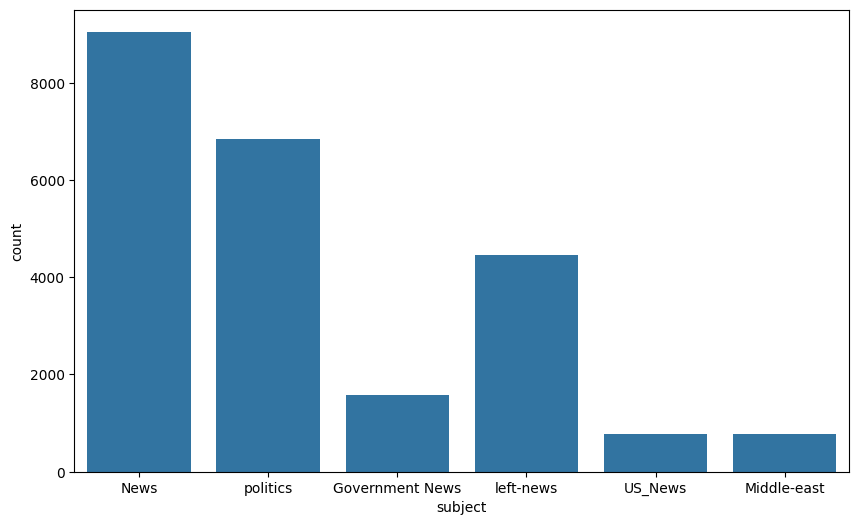

In [ ]:
import matplotlib.pyplot as plt
plt.figure(figsize = (10,6))
sns.countplot(x= 'subject',data = fake)

In [ ]:
text = ' '.join(fake['text'].tolist())

In [ ]:
' '.join(['this','is', 'news'])

'this is news'

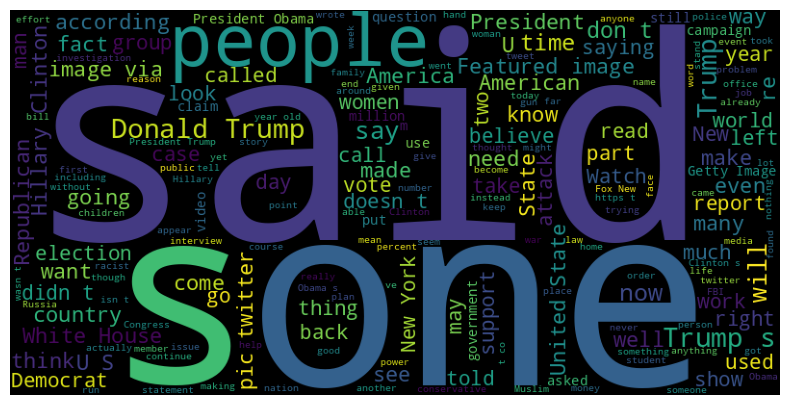

In [ ]:
from wordcloud import WordCloud
wordcloud = WordCloud(width=800, height=400).generate(text)

# Display the word cloud
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud)
plt.axis('off')
plt.show()

## EXPLORE TRUE NEWS

In [ ]:
true = pd.read_csv("True.csv")

In [ ]:
true.columns

Index(['title', 'text', 'subject', 'date'], dtype='object')

In [ ]:
text = ' '.join(true['text'].tolist())

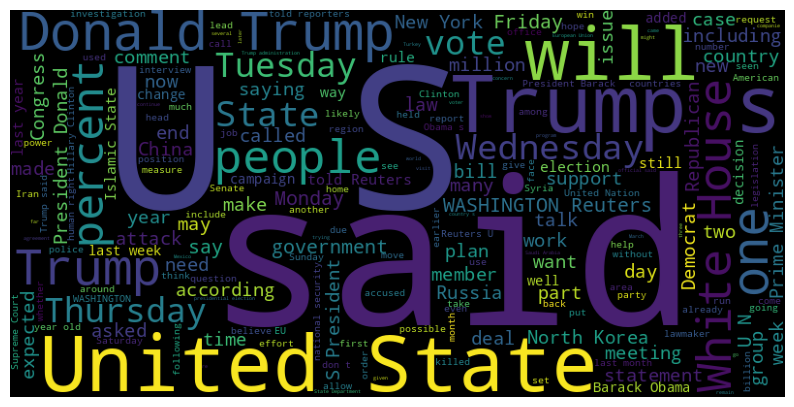

In [ ]:
from wordcloud import WordCloud
wordcloud = WordCloud(width=800, height=400).generate(text)

# Display the word cloud
plt.figure(figsize=(10,10))
plt.imshow(wordcloud)
plt.axis('off')
plt.show()

In [ ]:
true.head(5)

,title,text,subject,date
0,"As U.S. budget fight looms, Republicans flip t...",WASHINGTON (Reuters) - The head of a conservat...,politicsNews,"December 31, 2017"
1,U.S. military to accept transgender recruits o...,WASHINGTON (Reuters) - Transgender people will...,politicsNews,"December 29, 2017"
2,Senior U.S. Republican senator: 'Let Mr. Muell...,WASHINGTON (Reuters) - The special counsel inv...,politicsNews,"December 31, 2017"
3,FBI Russia probe helped by Australian diplomat...,WASHINGTON (Reuters) - Trump campaign adviser ...,politicsNews,"December 30, 2017"
4,Trump wants Postal Service to charge 'much mor...,SEATTLE/WASHINGTON (Reuters) - President Donal...,politicsNews,"December 29, 2017"


Index(['title', 'text', 'subject', 'date'], dtype='object')
Top Unigrams: [('said', 99062), ('trump', 54700), ('reuters', 28976), ('president', 28177), ('state', 21025), ('government', 18846), ('new', 16917), ('states', 16652), ('house', 16640), ('republican', 16243), ('united', 15590), ('people', 15287), ('year', 14777), ('told', 14245), ('washington', 12988), ('party', 12759), ('election', 12306), ('campaign', 10636), ('donald', 10456), ('security', 10162)]
Top Bigrams: [('united states', 12204), ('donald trump', 10168), ('white house', 8419), ('washington reuters', 6674), ('president donald', 5930), ('north korea', 5659), ('new york', 4740), ('prime minister', 4163), ('said statement', 3933), ('trump said', 3551), ('told reuters', 3495), ('islamic state', 3477), ('barack obama', 3344), ('told reporters', 3176), ('president barack', 2958), ('hillary clinton', 2499), ('supreme court', 2478), ('trump administration', 2459), ('reuters president', 2390), ('united nations', 2312)]
Top Tri

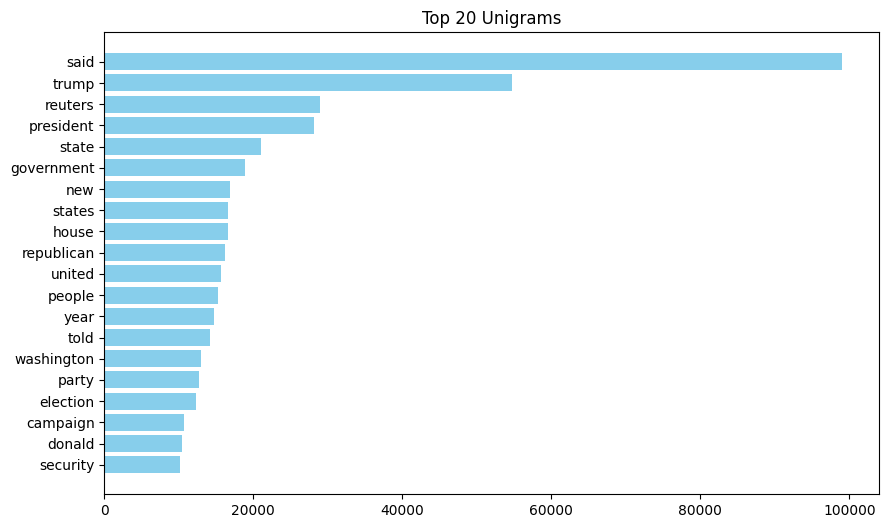

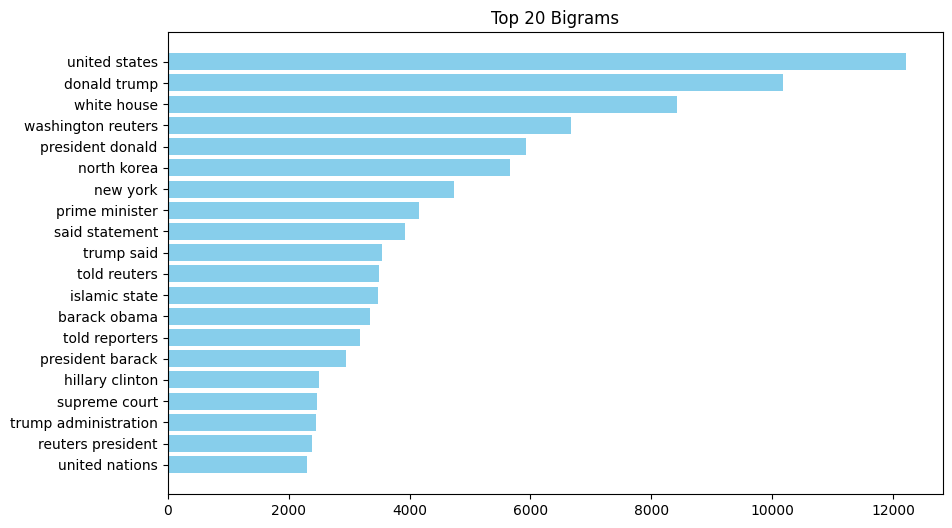

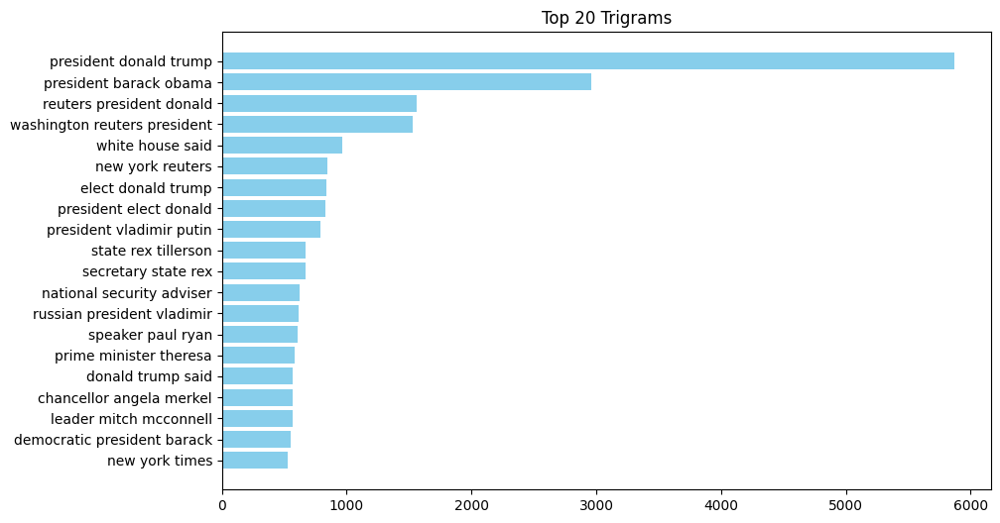

In [25]:
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.feature_extraction.text import CountVectorizer

df = pd.read_csv("True.csv")

# Check column names
print(df.columns)

text_data = df['text'].astype(str)

# =======================
# N-gram function
# =======================
def get_top_ngrams(corpus, n=None, gram_range=(1,1)):
    vec = CountVectorizer(ngram_range=gram_range, stop_words='english').fit(corpus)
    bag_of_words = vec.transform(corpus)
    sum_words = bag_of_words.sum(axis=0)
    words_freq = [(word, sum_words[0, idx]) for word, idx in vec.vocabulary_.items()]
    words_freq = sorted(words_freq, key=lambda x: x[1], reverse=True)
    return words_freq[:n]

# =======================
# Unigrams, Bigrams, Trigrams
# =======================
top_unigrams = get_top_ngrams(text_data, n=20, gram_range=(1,1))
top_bigrams = get_top_ngrams(text_data, n=20, gram_range=(2,2))
top_trigrams = get_top_ngrams(text_data, n=20, gram_range=(3,3))

print("Top Unigrams:", top_unigrams)
print("Top Bigrams:", top_bigrams)
print("Top Trigrams:", top_trigrams)

# =======================
# Plotting
# =======================
def plot_top_ngrams(ngrams, title):
    x, y = zip(*ngrams)
    plt.figure(figsize=(10,6))
    plt.barh(x, y, color="skyblue")
    plt.title(title)
    plt.gca().invert_yaxis()
    plt.show()

plot_top_ngrams(top_unigrams, "Top 20 Unigrams")
plot_top_ngrams(top_bigrams, "Top 20 Bigrams")
plot_top_ngrams(top_trigrams, "Top 20 Trigrams")

In [ ]:
unknown_publishers = []
for index, row in enumerate(true.text.values):
  try:
    record = row.split('-', maxsplit = 1)
    record[1]

    assert(len(record[0])<120)
  except:
    unknown_publishers.append(index)


In [ ]:
len(unknown_publishers)

222

In [ ]:
true.iloc[unknown_publishers].text

,text
7,The following statements were posted to the ve...
8,The following statements were posted to the ve...
12,The following statements were posted to the ve...
13,The following statements were posted to the ve...
14,"(In Dec. 25 story, in second paragraph, corre..."
...,...
20135,(Story corrects to million from billion in pa...
20500,"(This Sept 8 story corrects headline, clarifi..."
20667,"(Story refiles to add dropped word not , in ..."
21246,(Story corrects third paragraph to show Mosul...


In [ ]:
true.iloc[8970]

,8970
title,Graphic: Supreme Court roundup
text,
subject,politicsNews
date,"June 16, 2016"


In [ ]:
true = true.drop(8970,axis = 0)

In [ ]:
publisher = []
tmp_text = []

for index, row in enumerate(true.text.values):
    if index in unknown_publishers:
        tmp_text.append(row)
        publisher.append('Unknown')
    else:
        record = row.split('-', maxsplit=1)
        publisher.append(record[0].strip())
        tmp_text.append(record[1].strip())

In [ ]:
true['publisher'] = publisher
true['text'] = tmp_text

In [ ]:
true.head(10)

,title,text,subject,date,publisher
0,"As U.S. budget fight looms, Republicans flip t...",The head of a conservative Republican faction ...,politicsNews,"December 31, 2017",WASHINGTON (Reuters)
1,U.S. military to accept transgender recruits o...,Transgender people will be allowed for the fir...,politicsNews,"December 29, 2017",WASHINGTON (Reuters)
2,Senior U.S. Republican senator: 'Let Mr. Muell...,The special counsel investigation of links bet...,politicsNews,"December 31, 2017",WASHINGTON (Reuters)
3,FBI Russia probe helped by Australian diplomat...,Trump campaign adviser George Papadopoulos tol...,politicsNews,"December 30, 2017",WASHINGTON (Reuters)
4,Trump wants Postal Service to charge 'much mor...,President Donald Trump called on the U.S. Post...,politicsNews,"December 29, 2017",SEATTLE/WASHINGTON (Reuters)
5,"White House, Congress prepare for talks on spe...",The White House said on Friday it was set to k...,politicsNews,"December 29, 2017","WEST PALM BEACH, Fla./WASHINGTON (Reuters)"
6,"Trump says Russia probe will be fair, but time...",President Donald Trump said on Thursday he bel...,politicsNews,"December 29, 2017","WEST PALM BEACH, Fla (Reuters)"
7,Factbox: Trump on Twitter (Dec 29) - Approval ...,The following statements were posted to the ve...,politicsNews,"December 29, 2017",Unknown
8,Trump on Twitter (Dec 28) - Global Warming,The following statements were posted to the ve...,politicsNews,"December 29, 2017",Unknown
9,Alabama official to certify Senator-elect Jone...,Alabama Secretary of State John Merrill said h...,politicsNews,"December 28, 2017",WASHINGTON (Reuters)


In [ ]:
true.shape

(21416, 5)

In [ ]:
empty_fake_index = [index for index,text in enumerate (fake.text.tolist()) if str(text).strip() == ""]
empty_fake_index

[10923,
 11041,
 11190,
 11225,
 11236,
 11241,
 11247,
 11249,
 11267,
 11268,
 11283,
 11284,
 11285,
 11289,
 11290,
 11292,
 11295,
 11296,
 11301,
 11303,
 11304,
 11305,
 11309,
 11314,
 11317,
 11319,
 11322,
 11330,
 11334,
 11335,
 11340,
 11343,
 11348,
 11351,
 11352,
 11357,
 11371,
 11373,
 11374,
 11382,
 11397,
 11402,
 11403,
 11409,
 11410,
 11412,
 11415,
 11419,
 11421,
 11427,
 11431,
 11432,
 11440,
 11448,
 11450,
 11453,
 11462,
 11464,
 11465,
 11472,
 11473,
 11475,
 11478,
 11489,
 11491,
 11493,
 11494,
 11501,
 11505,
 11507,
 11520,
 11531,
 11532,
 11533,
 11538,
 11542,
 11547,
 11549,
 11551,
 11559,
 11563,
 11581,
 11585,
 11589,
 11590,
 11614,
 11624,
 11625,
 11627,
 11631,
 11636,
 11637,
 11643,
 11650,
 11658,
 11661,
 11672,
 11679,
 11681,
 11684,
 11686,
 11688,
 11692,
 11708,
 11718,
 11729,
 11739,
 11753,
 11765,
 11768,
 11777,
 11782,
 11786,
 11788,
 11792,
 11793,
 11803,
 11806,
 11813,
 11821,
 11831,
 11832,
 11841,
 11844,
 11848,


In [ ]:
fake.iloc[empty_fake_index]

,title,text,subject,date
10923,TAKE OUR POLL: Who Do You Think President Trum...,,politics,"May 10, 2017"
11041,Joe Scarborough BERATES Mika Brzezinski Over “...,,politics,"Apr 26, 2017"
11190,WATCH TUCKER CARLSON Scorch Sanctuary City May...,,politics,"Apr 6, 2017"
11225,MAYOR OF SANCTUARY CITY: Trump Trying To Make ...,,politics,"Apr 2, 2017"
11236,SHOCKER: Public School Turns Computer Lab Into...,,politics,"Apr 1, 2017"
...,...,...,...,...
21816,BALTIMORE BURNS: MARYLAND GOVERNOR BRINGS IN N...,,left-news,"Apr 27, 2015"
21826,FULL VIDEO: THE BLOCKBUSTER INVESTIGATION INTO...,,left-news,"Apr 25, 2015"
21827,(VIDEO) HILLARY CLINTON: RELIGIOUS BELIEFS MUS...,,left-news,"Apr 25, 2015"
21857,(VIDEO)ICE PROTECTING OBAMA: WON’T RELEASE NAM...,,left-news,"Apr 14, 2015"


In [ ]:
fake['text']= fake['title']+" "+fake['text']
true['text']= true['title']+" "+true['text']


In [ ]:
true['text'] = true['text'].apply(lambda x: str(x).lower())
fake['text'] = fake['text'].apply(lambda x: str(x).lower())

## Data Preprocessing

In [ ]:
true['class'] = 1
fake['class'] = 0

In [ ]:
true.columns

Index(['title', 'text', 'subject', 'date', 'publisher', 'class'], dtype='object')

In [ ]:
true = true[['text','class']]
fake = fake[['text','class']]


In [ ]:
data = pd.concat([true, fake], ignore_index=True)
data

,text,class
0,"as u.s. budget fight looms, republicans flip t...",1
1,u.s. military to accept transgender recruits o...,1
2,senior u.s. republican senator: 'let mr. muell...,1
3,fbi russia probe helped by australian diplomat...,1
4,trump wants postal service to charge 'much mor...,1
...,...,...
44892,mcpain: john mccain furious that iran treated ...,0
44893,justice? yahoo settles e-mail privacy class-ac...,0
44894,sunnistan: us and allied ‘safe zone’ plan to t...,0
44895,how to blow $700 million: al jazeera america f...,0


In [31]:
def clean_text(text):
    text = str(text)
    text = re.sub(r"[^a-zA-Z0-9\s]", " ", text)  # remove special chars
    text = re.sub(r"\s+", " ", text)  # remove extra spaces
    text = text.strip()  # remove leading/trailing spaces
    return text
data["text"] = data["text"].apply(clean_text)

print(data.head())


                                                text  class
0  as u s budget fight looms republicans flip the...      1
1  u s military to accept transgender recruits on...      1
2  senior u s republican senator let mr mueller d...      1
3  fbi russia probe helped by australian diplomat...      1
4  trump wants postal service to charge much more...      1


In [ ]:
sample = "  This@@ is   Fake!!!    News???  "
print(clean_text(sample))


This is Fake News


In [2]:
!pip install gensim


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 61.0/61.0 kB 4.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 60.6/60.6 kB 4.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 26.6/26.6 MB 29.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 18.0/18.0 MB 42.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 38.2/38.2 MB 8.8 MB/s eta 0:00:00
  Attempting uninstall: numpy
    Found existing installation: numpy 2.0.2
    Uninstalling numpy-2.0.2:
      Successfully uninstalled numpy-2.0.2
  Attempting uninstall: scipy
    Found existing installation: scipy 1.16.2
    Uninstalling scipy-1.16.2:
      Successfully uninstalled scipy-1.16.2
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
opencv-contrib-python 4.12.0.88 requires numpy<2.3.0,>=2; python_version >= "3.9", but you have numpy 1.26.4 which is incompatible

In [1]:
import gensim

In [2]:
import pandas as pd
data = pd.read_csv('data.csv')

In [3]:
y = data['class'].values

In [4]:
X=[d.split() for d in data['text'].tolist()]

In [5]:
type(X)

list

In [6]:
DIM = 100
w2v_model = gensim.models.Word2Vec(
    sentences=X,
    vector_size=DIM,
    window=10,
    min_count=1
)


In [7]:
len(w2v_model.wv.key_to_index)


121868

In [8]:
w2v_model.wv['love']

array([ 2.7059925 ,  2.6925309 ,  0.6727284 , -1.501525  , -0.81326574,
       -2.6679294 ,  5.459656  ,  2.3921056 , -0.09939866, -0.16558069,
        0.91502815,  1.5195246 , -1.8083298 ,  0.32134208, -2.203478  ,
       -1.8350298 ,  0.0432943 , -2.3442209 , -2.003682  ,  5.9035964 ,
        0.5073281 ,  1.1651884 ,  0.6590754 ,  0.37300816,  0.65472   ,
        3.687497  ,  3.3843465 , -1.9839659 , -0.9020724 , -2.5433807 ,
        4.5976896 , -2.4216201 , -0.18940106,  0.6397642 , -0.1658735 ,
       -0.49228886,  0.07700426,  0.416952  ,  0.41494298, -2.3909872 ,
       -1.1003673 ,  1.7904092 ,  2.4148448 , -2.5066164 ,  3.0740755 ,
       -1.4539874 , -3.2391083 ,  1.811977  , -1.383459  ,  0.01915468,
        2.5880556 ,  5.5621257 ,  1.4307004 , -4.5309715 , -2.842827  ,
       -1.4648196 , -3.5070157 ,  1.1466724 , -1.3730723 , -0.81876135,
       -0.8960432 , -2.0597496 , -2.250943  , -3.3917336 ,  1.5959858 ,
        0.1736092 ,  0.58349955, -0.43203497, -0.96161765,  0.66

In [9]:
w2v_model.wv.most_similar("china")


[('beijing', 0.8575666546821594),
 ('taiwan', 0.7990388870239258),
 ('chinese', 0.7233176827430725),
 ('pyongyang', 0.6801908612251282),
 ('india', 0.663737416267395),
 ('japan', 0.6565348505973816),
 ('xi', 0.6187909245491028),
 ('waterway', 0.6156169176101685),
 ('vietnam', 0.5903788208961487),
 ('territorial', 0.5901272296905518)]

In [12]:
tokenizer = Tokenizer()
tokenizer.fit_on_texts(X)

In [13]:
X = tokenizer.texts_to_sequences(X)

In [ ]:
X

[[18,
  35,
  7,
  513,
  519,
  10674,
  137,
  5683,
  42,
  1432,
  5007,
  1,
  435,
  3,
  4,
  316,
  77,
  6367,
  6,
  1,
  35,
  7,
  196,
  29,
  829,
  26,
  266,
  10,
  4,
  1165,
  3017,
  3,
  1,
  130,
  961,
  2,
  473,
  10,
  188,
  1236,
  163,
  407,
  4,
  1432,
  316,
  9,
  358,
  5,
  1176,
  513,
  7718,
  6,
  1193,
  6,
  1804,
  16,
  4,
  3397,
  7954,
  148,
  166,
  347,
  137,
  35,
  7,
  846,
  922,
  7695,
  644,
  9,
  1940,
  463,
  1,
  334,
  1823,
  4,
  536,
  579,
  9,
  180,
  729,
  52,
  442,
  28,
  16951,
  2,
  90,
  1386,
  68,
  6,
  437,
  59,
  30,
  789,
  25,
  1,
  8021,
  9,
  210,
  442,
  40,
  1479,
  390,
  2,
  906,
  4,
  180,
  513,
  6,
  4,
  519,
  336,
  2,
  22,
  1711,
  2,
  81,
  460,
  184,
  18,
  323,
  214,
  109,
  18,
  1,
  512,
  615,
  94,
  2086,
  1569,
  6,
  52,
  137,
  40,
  1151,
  2,
  416,
  361,
  3,
  196,
  36,
  70,
  12,
  5,
  19,
  137,
  189,
  4,
  401,
  513,
  1013,
  6,
  177,
  729,
 

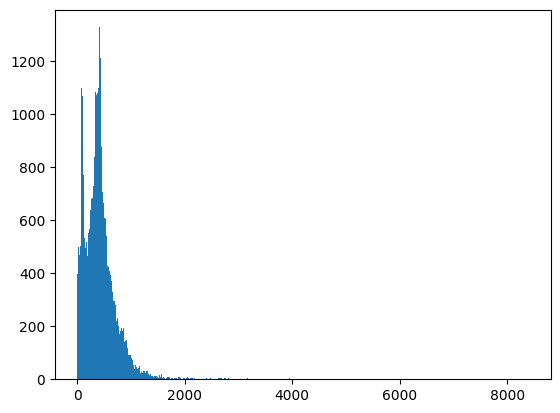

In [14]:
import matplotlib.pyplot as plt
plt.hist([len(x) for x in X],bins = 700)
plt.show()

In [ ]:
# Save your preprocessed dataset to CSV
data.to_csv("data.csv", index=False)

print("✅ File saved as preprocessed_data.csv")


✅ File saved as preprocessed_data.csv


In [ ]:
from google.colab import files
files.download("data.csv")


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [15]:
import numpy as np
nos = np.array([len(x) for x in X])
len(nos[nos>1000])

1767

In [16]:
maxlen = 1000
X = pad_sequences(X, maxlen = maxlen)

In [17]:
len(X[101])

1000

In [18]:
vocab_size = len(tokenizer.word_index)+1
vocab = tokenizer.word_index

In [19]:
def get_weight_matrix(model):
    # Create empty weight matrix
    weight_matrix = np.zeros((vocab_size, DIM))

    for word, i in vocab.items():
        if word in model.wv:   # check if word exists in Word2Vec
            weight_matrix[i] = model.wv[word]

    return weight_matrix


In [20]:
embedding_matrix = get_weight_matrix(w2v_model)

In [ ]:
embedding_matrix.shape

(121869, 100)

In [21]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Embedding, LSTM, Dense

model = Sequential()
model.add(Embedding(vocab_size,
                    output_dim=DIM,
                    weights=[embedding_matrix],
                    input_length=maxlen,
                    trainable=False))
model.add(LSTM(units=128))
model.add(Dense(1, activation='sigmoid'))

model.compile(optimizer='adam',
              loss='binary_crossentropy',
              metrics=['accuracy'])


/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/embedding.py:97: UserWarning: Argument `input_length` is deprecated. Just remove it.
  warnings.warn(


In [22]:
model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ embedding (Embedding)           │ ?                      │    12,186,900 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm (LSTM)                     │ ?                      │   0 (unbuilt) │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ ?                      │   0 (unbuilt) │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 12,186,900 (46.49 MB)

 Trainable params: 0 (0.00 B)

 Non-trainable params: 12,186,900 (46.49 MB)

In [23]:
from sklearn.model_selection import train_test_split
X_train,X_test,y_train,y_test = train_test_split(X,y)

In [26]:
model.fit(X_train,y_train, validation_split=0.3,epochs=5)

Epoch 1/5
737/737 ━━━━━━━━━━━━━━━━━━━━ 976s 1s/step - accuracy: 0.9239 - loss: 0.2010 - val_accuracy: 0.9713 - val_loss: 0.0875
Epoch 2/5
737/737 ━━━━━━━━━━━━━━━━━━━━ 966s 1s/step - accuracy: 0.9748 - loss: 0.0750 - val_accuracy: 0.9685 - val_loss: 0.0871
Epoch 3/5
737/737 ━━━━━━━━━━━━━━━━━━━━ 968s 1s/step - accuracy: 0.9779 - loss: 0.0643 - val_accuracy: 0.9792 - val_loss: 0.0535
Epoch 4/5
737/737 ━━━━━━━━━━━━━━━━━━━━ 967s 1s/step - accuracy: 0.9878 - loss: 0.0332 - val_accuracy: 0.9903 - val_loss: 0.0339
Epoch 5/5
737/737 ━━━━━━━━━━━━━━━━━━━━ 971s 1s/step - accuracy: 0.9957 - loss: 0.0132 - val_accuracy: 0.9940 - val_loss: 0.0224


351/351 ━━━━━━━━━━━━━━━━━━━━ 146s 415ms/step
Accuracy: 0.9918930957683741
Precision: 0.9867041198501872
Recall: 0.9962185668368312
F1 Score: 0.9914385172640888

Classification Report:
               precision    recall  f1-score   support

           0       1.00      0.99      0.99      5936
           1       0.99      1.00      0.99      5289

    accuracy                           0.99     11225
   macro avg       0.99      0.99      0.99     11225
weighted avg       0.99      0.99      0.99     11225



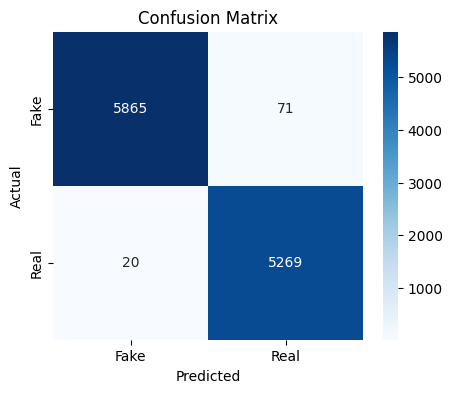

In [27]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix, classification_report, roc_auc_score
import matplotlib.pyplot as plt
import seaborn as sns

# ======================
# Predictions
# ======================
y_pred_prob = model.predict(X_test)   # probabilities
y_pred = (y_pred_prob > 0.5).astype("int32")  # convert to 0/1

# ======================
# Metrics
# ======================
acc = accuracy_score(y_test, y_pred)
prec = precision_score(y_test, y_pred)
rec = recall_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred)

print("Accuracy:", acc)
print("Precision:", prec)
print("Recall:", rec)
print("F1 Score:", f1)

# Detailed classification report
print("\nClassification Report:\n", classification_report(y_test, y_pred))

# Confusion Matrix Plot
cm = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(5,4))
sns.heatmap(cm, annot=True, fmt='d', cmap="Blues", xticklabels=["Fake","Real"], yticklabels=["Fake","Real"])
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix")
plt.show()


Epoch 1/5
369/369 ━━━━━━━━━━━━━━━━━━━━ 676s 2s/step - accuracy: 0.9976 - loss: 0.0073 - val_accuracy: 0.9937 - val_loss: 0.0204
Epoch 2/5
369/369 ━━━━━━━━━━━━━━━━━━━━ 677s 2s/step - accuracy: 0.9986 - loss: 0.0053 - val_accuracy: 0.9935 - val_loss: 0.0228
Epoch 3/5
369/369 ━━━━━━━━━━━━━━━━━━━━ 682s 2s/step - accuracy: 0.9983 - loss: 0.0057 - val_accuracy: 0.9925 - val_loss: 0.0269
Epoch 4/5
369/369 ━━━━━━━━━━━━━━━━━━━━ 726s 2s/step - accuracy: 0.9996 - loss: 0.0029 - val_accuracy: 0.9945 - val_loss: 0.0233
Epoch 5/5
369/369 ━━━━━━━━━━━━━━━━━━━━ 725s 2s/step - accuracy: 0.9985 - loss: 0.0059 - val_accuracy: 0.9945 - val_loss: 0.0245


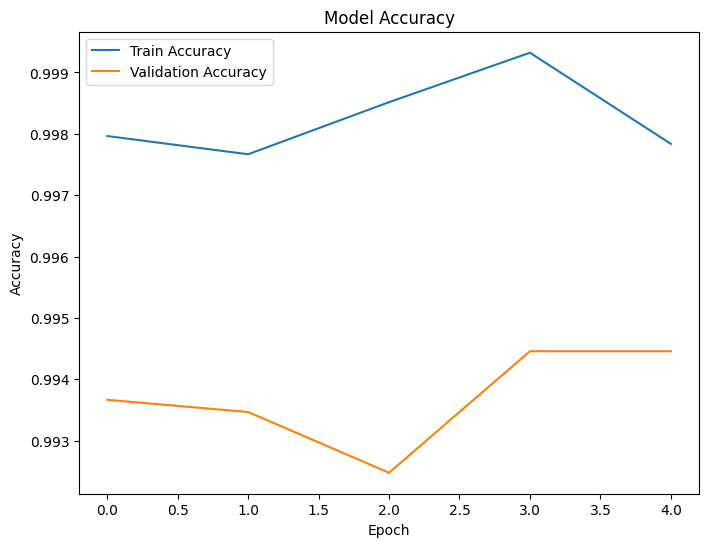

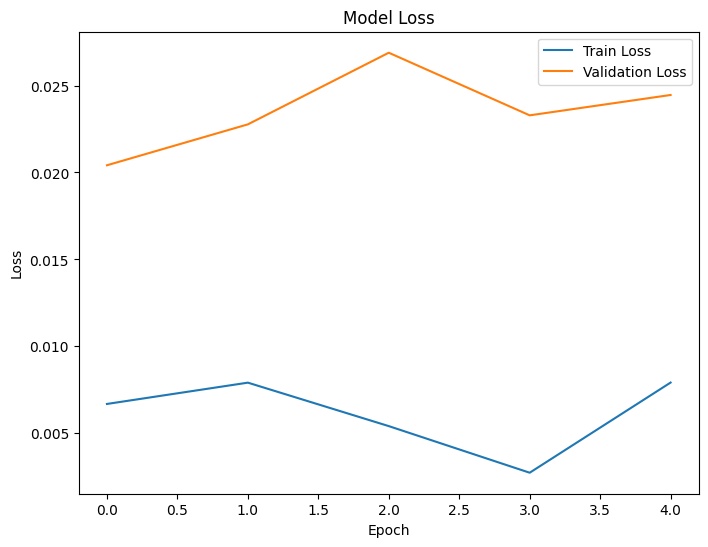

In [28]:
# Train model and save history
history = model.fit(X_train, y_train,
                    validation_split=0.3,
                    epochs=5,
                    batch_size=64,
                    verbose=1)

# ======================
# Plot Accuracy
# ======================
plt.figure(figsize=(8,6))
plt.plot(history.history['accuracy'], label='Train Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.title('Model Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

# ======================
# Plot Loss
# ======================
plt.figure(figsize=(8,6))
plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Model Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.show()
